In [1]:
import os
import pandas as pd
import calendar
import datetime
import monpa
from monpa import utils
import re
import numpy as np
import copy
import openpyxl
# from wakepy import set_keepawake, unset_keepawake

# set_keepawake(keep_screen_awake=True)

os.chdir('/Users/arthur/Desktop/factor_investment')

+---------------------------------------------------------------------+
  Welcome to MONPA: Multi-Objective NER POS Annotator for Chinese
+---------------------------------------------------------------------+
已找到 model檔。Found model file.


In [2]:
# 統深、數商上課內容
# 期中報告
# 寫常用函式庫

In [3]:
# 關聯分析 git
#v 平均分數
#v -1, 0, 1
# 成本 3/1000, 1.425/1000
# 同成本非同張數
# word embedding
# git

# 加上之前的base model也跑出結果
# 這禮拜先word embedding+簡報（過去加現在的結果）

In [4]:
# 少一點因子會比較好嗎
# 沒有考慮IR
# 精進輿情分析
# 標準化？

# import ffn 效能指標圖
# 關聯分析 git https://chwang12341.medium.com/machine-learning-關聯分析-apriori演算法-詳細解說啤酒與尿布的背後原理-python實作-scikit-learn一步一步教學-76b7778f8f34
# https://github.com/vedic-partap/Event-Driven-Stock-Prediction-using-Deep-Learning/blob/master/embeddingWord.py
# 簡報（過去加現在的結果）

In [5]:
from alphalens.tears import (create_returns_tear_sheet,
                      create_information_tear_sheet,
                      create_turnover_tear_sheet,
                      create_summary_tear_sheet,
                      create_full_tear_sheet,
                      create_event_returns_tear_sheet,
                      create_event_study_tear_sheet)

from alphalens.utils import get_clean_factor_and_forward_returns

In [6]:
# 我們從stopwords_zh.txt這個檔案中匯入繁體中文的停用詞
with open('./202202_Intern/stopwords_zh.txt', 'r') as file:
    stopwords = file.read().splitlines()
file.close()

with open('./202202_Intern/NTUSD_negative_unicode.txt', 'r') as file:
    nega_words = file.read().splitlines()
file.close()

with open('./202202_Intern/NTUSD_positive_unicode.txt', 'r') as file:
    posi_words = file.read().splitlines()
file.close()

# 這個function用來將字串以  **正則化**  處理去除中文字元以外的字元
def clearSentence(sentence):
    return re.sub(r'[^\u4e00-\u9fa5]+', '', sentence)

def calSen(content):
    sentence_list = utils.short_sentence(content)
    tokenStr = []
    for sentence in sentence_list:
        sentence = clearSentence(sentence)
        tokens = monpa.cut(sentence)
        tokenStr += tokens
        
    senScore = 0
    for i in tokenStr:
        if i in posi_words:
            senScore += 1
        elif i in nega_words:
            senScore -= 1
    return senScore

def find_key(dic, value):
    for keys, values in dic.items():  # for name, age in dictionary.iteritems():  (for Python 2.x)
        if value == values:
            return(keys)
            break

def trend(value):
    if value > 0:
        return 1
    elif value < 0:
        return -1
    else:
        return 0

# coid_dic

In [7]:
col_list = ["證券代碼", "簡稱", "年月日", "收盤價(元)"]
price = pd.read_csv('./data/TEJ_StockPrice_20052022.csv', encoding='big5', encoding_errors='ignore', usecols=col_list)
price["證券代碼"] = [str(x).strip() for x in price["證券代碼"]]
price["簡稱"] = [x.strip() for x in price["簡稱"]]
price.年月日 = pd.to_datetime(price.年月日).dt.date
price = price[price.年月日 > datetime.date(2012,12,31)].reset_index(drop=True)
price = price[price.年月日 < datetime.date(2022,1,1)].reset_index(drop=True)

/var/folders/w8/jwxq4stj29506b1pf67xpb000000gq/T/ipykernel_2514/449339189.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  price = pd.read_csv('./data/TEJ_StockPrice_20052022.csv', encoding='big5', encoding_errors='ignore', usecols=col_list)


In [8]:
# price[price['證券代碼']=='1311']

In [9]:
coid_stock = price[["證券代碼", "簡稱"]].drop_duplicates().reset_index(drop=True)

In [10]:
price.證券代碼.unique()

array(['15', '50', '51', ..., 'Y9999', 'Z50TR', 'ZGT50'], dtype=object)

In [11]:
coid_stock.loc[coid_stock.證券代碼==1311, '簡稱'].values

array([], dtype=object)

In [12]:
# candidatePoolDF = pd.read_excel('./計算溢酬/CTBCdata/10個因子原始資料.xlsx','125檔', dtype=str,index_col=0,header=1)
# candidatePool=list(candidatePoolDF.index)
candidatePoolDF = pd.read_csv('./data/StockValidation.csv')
candidatePool=list(candidatePoolDF['stock_id'])
candidatePool=[str(x) for x in candidatePool]

price = price.loc[price.證券代碼.isin(candidatePool), :].reset_index(drop=True)
candidatePool = np.unique(price.證券代碼.values)

coid_dic = {}

for i in candidatePool:
    # candidatePool中的1311只在2005~2008，不是我們要的
    try:
#         print(i)
        coid = i
        name = coid_stock.loc[coid_stock.證券代碼 == i, "簡稱"].values[0]
        coid_dic[coid] = name
    except:
        continue
#     print(coid_dic[i])

In [13]:
print(len(coid_dic))
coid_dic

1119


{'1101': '台泥',
 '1102': '亞泥',
 '1103': '嘉泥',
 '1104': '環泥',
 '1108': '幸福',
 '1109': '信大',
 '1110': '東泥',
 '1201': '味全',
 '1203': '味王',
 '1210': '大成',
 '1215': '卜蜂',
 '1216': '統一',
 '1217': '愛之味',
 '1218': '泰山',
 '1219': '福壽',
 '1225': '福懋油',
 '1227': '佳格',
 '1229': '聯華',
 '1231': '聯華食',
 '1232': '大統益',
 '1233': '天仁',
 '1234': '黑松',
 '1256': '鮮活果汁-KY',
 '1259': '安心',
 '1262': '綠悅-KY',
 '1264': '德麥',
 '1301': '台塑',
 '1303': '南亞',
 '1304': '台聚',
 '1305': '華夏',
 '1307': '三芳',
 '1308': '亞聚',
 '1309': '台達化',
 '1310': '台苯',
 '1312': '國喬',
 '1313': '聯成',
 '1314': '中石化',
 '1315': '達新',
 '1319': '東陽',
 '1321': '大洋',
 '1325': '琱j',
 '1326': '台化',
 '1333': '恩得利',
 '1337': '再生-KY',
 '1338': '廣華-KY',
 '1339': '昭輝',
 '1340': '勝悅-KY',
 '1402': '遠東新',
 '1409': '新纖',
 '1416': '廣豐',
 '1419': '新紡',
 '1434': '福懋',
 '1436': '華友聯',
 '1437': '勤益控',
 '1440': '南紡',
 '1442': '名軒',
 '1444': '力麗',
 '1447': '力鵬',
 '1451': '年興',
 '1455': '集盛',
 '1459': '聯發',
 '1460': '宏遠',
 '1464': '得力',
 '1471': '首利',
 '1473': '台南'

# Export Scored News

In [14]:
for i in range(2013, 2022):
    for j in range(1,13):
        try:
            pd.read_csv('./202202_Intern/ScoredData/'+str(i)+str(j)+'_cnyesnews.csv')
        except:
            print(i, j)
            try:
                df_news_1 = pd.read_csv('./202202_Intern/data/'+str(i)+str(j)+'1_cnyesnews.csv')[['date', 'title', 'content']]
                df_news_2 = pd.read_csv('./202202_Intern/data/'+str(i)+str(j)+'2_cnyesnews.csv')[['date', 'title', 'content']]
                df_news = pd.concat([df_news_1, df_news_2]).reset_index(drop=True)
                df_news.date = pd.to_datetime(df_news.date).dt.date
                
                for k in range(df_news.shape[0]):
                    try:
                        df_news.loc[k, 'title_score'] = calSen(df_news.loc[k, 'title'])
                    except:
                        df_news.loc[k, 'title_score'] = 0
                    try:
                        df_news.loc[k, 'content_score'] = calSen(df_news.loc[k, 'content'])
                    except:
                        df_news.loc[k, 'content_score'] = 0
                    if (k % 100) == 0:
                        print(k, ' / ', df_news.shape[0])

                df_news.to_csv('./202202_Intern/ScoredData/'+str(i)+str(j)+'_cnyesnews.csv')
            except:
                print('Oh! We lost '+ str(ii) + str(jj) + str(kk))
                continue

In [15]:
from wakepy import set_keepawake

set_keepawake(keep_screen_awake=False)

# Cnyes News

In [14]:
datetime.datetime.strptime(str(datetime.date(2013,1,1)), '%Y-%m-%d').date()

datetime.date(2013, 1, 1)

In [15]:
# 日期統一 data type 為 str

Heat = pd.DataFrame(columns=candidatePool)

for i in range(2013, 2022):
    for j in range(1,13):
        print(i, j)
        news_score = pd.read_csv('./202202_Intern/ScoredData/'+str(i)+str(j)+'_cnyesnews.csv') 
        for k in candidatePool:
#             print(k)
            news = news_score.loc[news_score.title.str.contains(coid_dic[k])|news_score.content.str.contains(coid_dic[k]), ].reset_index(drop=True)
            date = np.unique(news.date)
            for m in date:
#                 print(m)
                daily_news = news.loc[news.date == m].reset_index(drop=True)
#                 Title_SenScore.loc[m, k] = np.nansum(daily_news['title_score'].values) / len(daily_news['title_score'].values)
#                 Title_Trend.loc[m, k] = trend(Title_SenScore.loc[m, k])
#                 Content_SenScore.loc[m, k] = np.nansum(daily_news['content_score'].values) / len(daily_news['content_score'].values)
#                 Content_Trend.loc[m, k] = trend(Content_SenScore.loc[m, k])
                Heat.loc[m, k] = len(daily_news['content_score'].values)
#                 較好的方法：先跑每篇title/content的score，再去合併相加score
#                 較不好的方法：先合併連接單日單股的title/content，再去跑score
#                 daily_titles = '。'.join(daily_news.title)
#                 daily_contents = '。'.join(daily_news.content)
#                 Title_SenScore.loc[m, k] = calSen(daily_titles)
#                 Content_SenScore.loc[m, k] = calSen(daily_contents)

2013 1
2013 2
2013 3
2013 4
2013 5
2013 6
2013 7
2013 8
2013 9
2013 10
2013 11
2013 12
2014 1
2014 2
2014 3
2014 4
2014 5
2014 6
2014 7
2014 8
2014 9
2014 10
2014 11
2014 12
2015 1
2015 2
2015 3
2015 4
2015 5
2015 6
2015 7
2015 8
2015 9
2015 10
2015 11
2015 12
2016 1
2016 2
2016 3
2016 4
2016 5
2016 6
2016 7
2016 8
2016 9
2016 10
2016 11
2016 12
2017 1
2017 2
2017 3
2017 4
2017 5
2017 6
2017 7
2017 8
2017 9
2017 10
2017 11
2017 12
2018 1
2018 2
2018 3
2018 4
2018 5
2018 6
2018 7
2018 8
2018 9
2018 10
2018 11
2018 12
2019 1
2019 2
2019 3
2019 4
2019 5
2019 6
2019 7
2019 8
2019 9
2019 10
2019 11
2019 12
2020 1
2020 2
2020 3
2020 4
2020 5
2020 6
2020 7
2020 8
2020 9
2020 10
2020 11
2020 12
2021 1
2021 2
2021 3
2021 4
2021 5
2021 6
2021 7
2021 8
2021 9
2021 10
2021 11
2021 12


In [16]:
# Title_SenScore = Title_SenScore.sort_index()
# Title_Trend = Title_Trend.sort_index()
# Content_SenScore = Content_SenScore.sort_index()
# Content_Trend = Content_Trend.sort_index()
Heat = Heat.sort_index()

# Title_SenScore.index = pd.to_datetime(Title_SenScore.index).date
# Title_Trend.index = pd.to_datetime(Title_Trend.index).date
# Content_SenScore.index = pd.to_datetime(Content_SenScore.index).date
# Content_Trend.index = pd.to_datetime(Content_Trend.index).date
Heat.index = pd.to_datetime(Heat.index).date

# Title_SenScore = Title_SenScore[Title_SenScore.index > datetime.date(2012,12,31)]
# Title_SenScore = Title_SenScore[Title_SenScore.index < datetime.date(2022,1,1)]
# Title_Trend = Title_Trend[Title_Trend.index > datetime.date(2012,12,31)]
# Title_Trend = Title_Trend[Title_Trend.index < datetime.date(2022,1,1)]
Heat = Heat[Heat.index > datetime.date(2012,12,31)]
Heat = Heat[Heat.index < datetime.date(2022,1,1)]

# Content_SenScore = Content_SenScore[Content_SenScore.index > datetime.date(2012,12,31)]
# Content_SenScore = Content_SenScore[Content_SenScore.index < datetime.date(2022,1,1)]
# Content_Trend = Content_Trend[Content_Trend.index > datetime.date(2012,12,31)]
# Content_Trend = Content_Trend[Content_Trend.index < datetime.date(2022,1,1)]

# Title_SenScore_1 = Title_SenScore.fillna(0)
# Content_SenScore_1 = Content_SenScore.fillna(0)

# Title_SenScore_2 = Title_SenScore.fillna(method='ffill')
# Content_SenScore_2 = Content_SenScore.fillna(method='ffill')

# Title_SenScore_3 = Title_SenScore.fillna(method='ffill', limit=5)
# Content_SenScore_3 = Content_SenScore.fillna(method='ffill', limit=5)

# Title_Trend_1 = Title_Trend.fillna(0)
# Content_Trend_1 = Content_Trend.fillna(0)

In [17]:
Heat

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,1,NaN,NaN,6,NaN,NaN,...,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN
2013-01-03,2,NaN,NaN,NaN,1,3,NaN,2,NaN,NaN,...,3,NaN,NaN,NaN,5,NaN,NaN,NaN,NaN,NaN
2013-01-04,4,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,NaN,NaN,NaN,NaN,2,1,NaN,NaN,NaN,NaN,...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
groups = Heat.notna().cumsum()
exp = Heat.apply(lambda col: col.isna().groupby(groups[col.name]).cumsum())

In [19]:
Heat_1 = Heat.ffill().mul(0.5 ** exp)
Heat_1

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,1.00,NaN,NaN,6.000000e+00,NaN,NaN,...,NaN,NaN,NaN,NaN,2.000000e+00,NaN,NaN,NaN,NaN,NaN
2013-01-03,2.0000,NaN,NaN,NaN,1.00,3.00000,NaN,2.000000e+00,NaN,NaN,...,3.000000,NaN,NaN,NaN,5.000000e+00,NaN,NaN,NaN,NaN,NaN
2013-01-04,4.0000,NaN,NaN,NaN,1.00,1.50000,NaN,1.000000e+00,NaN,1.00,...,2.000000,NaN,NaN,NaN,2.500000e+00,NaN,NaN,NaN,NaN,NaN
2013-01-05,2.0000,NaN,NaN,NaN,2.00,1.00000,NaN,5.000000e-01,NaN,0.50,...,1.000000,NaN,NaN,NaN,1.250000e+00,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.1250,0.50000,4.768372e-07,2.910383e-11,1.00,0.50000,4.768372e-07,8.470329e-22,1.033976e-25,1.00,...,0.125000,9.094947e-13,0.000061,9.860761e-32,2.220446e-16,4.421718e-75,1.387779e-17,0.000122,2.775558e-17,0.007812
2021-12-28,0.0625,0.25000,2.384186e-07,1.455192e-11,0.50,0.25000,2.384186e-07,4.235165e-22,5.169879e-26,0.50,...,0.062500,4.547474e-13,0.000031,4.930381e-32,1.110223e-16,2.210859e-75,6.938894e-18,0.000061,1.387779e-17,0.003906
2021-12-29,1.0000,0.12500,1.000000e+00,7.275958e-12,0.25,0.12500,1.192093e-07,2.117582e-22,2.584939e-26,1.00,...,0.031250,2.273737e-13,0.000015,2.465190e-32,5.551115e-17,1.105430e-75,3.469447e-18,0.000031,6.938894e-18,0.001953
2021-12-30,0.5000,0.06250,5.000000e-01,3.637979e-12,1.00,0.06250,5.960464e-08,1.058791e-22,1.292470e-26,0.50,...,0.015625,1.136868e-13,0.000008,1.232595e-32,2.775558e-17,5.527148e-76,1.734723e-18,0.000015,3.469447e-18,0.000977


In [20]:
exp_1 = copy.copy(exp)
# exp_1[exp_1 > 3] = float('inf')
# exp_1[exp_1 > 5] = float('inf')
exp_1[exp_1 > 30] = float('inf')
exp_1

Heat_2 = Heat.ffill().mul(0.5 ** exp_1)
Heat_2

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,1.00,NaN,NaN,6.0,NaN,NaN,...,NaN,NaN,NaN,NaN,2.00,NaN,NaN,NaN,NaN,NaN
2013-01-03,2.0000,NaN,NaN,NaN,1.00,3.00000,NaN,2.0,NaN,NaN,...,3.000000,NaN,NaN,NaN,5.00,NaN,NaN,NaN,NaN,NaN
2013-01-04,4.0000,NaN,NaN,NaN,1.00,1.50000,NaN,1.0,NaN,1.00,...,2.000000,NaN,NaN,NaN,2.50,NaN,NaN,NaN,NaN,NaN
2013-01-05,2.0000,NaN,NaN,NaN,2.00,1.00000,NaN,0.5,NaN,0.50,...,1.000000,NaN,NaN,NaN,1.25,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.1250,0.50000,4.768372e-07,0.0,1.00,0.50000,4.768372e-07,0.0,0.0,1.00,...,0.125000,0.0,0.000061,0.0,0.00,0.0,0.0,0.000122,0.0,0.007812
2021-12-28,0.0625,0.25000,2.384186e-07,0.0,0.50,0.25000,2.384186e-07,0.0,0.0,0.50,...,0.062500,0.0,0.000031,0.0,0.00,0.0,0.0,0.000061,0.0,0.003906
2021-12-29,1.0000,0.12500,1.000000e+00,0.0,0.25,0.12500,1.192093e-07,0.0,0.0,1.00,...,0.031250,0.0,0.000015,0.0,0.00,0.0,0.0,0.000031,0.0,0.001953
2021-12-30,0.5000,0.06250,5.000000e-01,0.0,1.00,0.06250,5.960464e-08,0.0,0.0,0.50,...,0.015625,0.0,0.000008,0.0,0.00,0.0,0.0,0.000015,0.0,0.000977


In [21]:
print(price.shape)
prices = pd.DataFrame(columns = Heat.columns)
for i in price.index:
    coid = price.loc[i, "證券代碼"]
    date = price.loc[i, "年月日"]
    close = price.loc[i, "收盤價(元)"]
    prices.loc[date, coid] = close
    if (i % 10000) == 0:
        print(i//10000, end=' ')

(2180235, 4)
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 

In [22]:
prices

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-02,19.4604,22.989,9.8299,9.7465,4.8295,7.9,12.9092,33.6474,14.3701,11.797,...,18.8132,66.8,31.7298,21.3076,24.8034,9.0194,29.4123,28.6743,9.0,10.0287
2013-01-03,19.3856,23.0197,9.8654,9.8672,4.8942,7.8631,13.0018,33.6037,14.4766,11.7532,...,18.7035,68.0,31.6335,20.9988,26.5045,8.9721,29.3428,28.8221,9.1,9.9173
2013-01-04,19.4604,22.8355,9.7945,10.0483,4.9806,7.8631,12.7704,33.4728,14.3701,11.797,...,18.7912,68.3,31.7619,21.0245,26.1484,9.0431,28.9256,28.8221,9.1,9.7687
2013-01-07,19.4105,22.7127,9.8654,10.2595,5.0526,7.9,12.9555,34.5638,14.654,11.9067,...,18.8351,67.2,31.8902,20.973,25.9506,9.2325,28.9951,28.9699,8.83,9.9916
2013-01-08,19.2109,22.6207,9.9009,10.3198,5.0238,7.7892,13.0018,34.1711,14.4766,11.9286,...,18.7912,66.9,31.8581,20.9473,25.5155,9.1141,28.9951,28.5265,8.75,9.843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-24,47.9,44.25,20.5,21.6,11.7,20.2,20.0,21.9,32.25,51.2601,...,36.2,172.0,91.6,60.9,63.3,14.9,78.9,17.25,11.5,110.5
2021-12-27,48.1,44.15,20.5,21.55,11.8,20.15,20.0,22.0,32.55,51.2601,...,35.55,173.0,91.9,60.7,63.0,15.0,78.7,17.25,11.35,110.5
2021-12-28,48.15,44.2,20.7,21.6,11.75,20.3,20.1,22.15,32.8,52.1355,...,35.15,174.0,91.9,60.8,63.0,15.0,78.3,17.2,11.3,110.5
2021-12-29,48.15,44.25,20.85,21.55,11.9,20.4,20.35,22.35,32.8,51.941,...,35.25,174.5,96.9,60.5,63.5,15.1,78.8,17.2,11.4,111.0


In [23]:
for i in Heat.index:
    if i not in prices.index.values:
        print(i)
        prices.loc[i, :] = [np.nan]*1119

prices = prices.sort_index()
prices = prices.fillna(method='ffill')

2013-01-01
2013-01-05
2013-01-06
2013-01-12
2013-01-13
2013-01-19
2013-01-20
2013-01-26
2013-01-27
2013-02-02
2013-02-03
2013-02-07
2013-02-08
2013-02-09
2013-02-10
2013-02-11
2013-02-12
2013-02-13
2013-02-14
2013-02-15
2013-02-16
2013-02-17
2013-02-24
2013-02-28
2013-03-02
2013-03-03
2013-03-09
2013-03-10
2013-03-16
2013-03-17
2013-03-23
2013-03-24
2013-03-30
2013-03-31
2013-04-04
2013-04-05
2013-04-06
2013-04-07
2013-04-13
2013-04-14
2013-04-20
2013-04-21
2013-04-27
2013-04-28
2013-05-01
2013-05-04
2013-05-05
2013-05-11
2013-05-12
2013-05-18
2013-05-19
2013-05-25
2013-05-26
2013-06-01
2013-06-02
2013-06-08
2013-06-09
2013-06-12
2013-06-15
2013-06-16
2013-06-22
2013-06-23
2013-06-29
2013-06-30
2013-07-06
2013-07-07
2013-07-13
2013-07-14
2013-07-20
2013-07-21
2013-07-27
2013-07-28
2013-08-03
2013-08-04
2013-08-10
2013-08-11
2013-08-17
2013-08-18
2013-08-21
2013-08-24
2013-08-25
2013-08-31
2013-09-01
2013-09-07
2013-09-08
2013-09-15
2013-09-19
2013-09-20
2013-09-21
2013-09-22
2013-09-28

2019-03-10
2019-03-16
2019-03-17
2019-03-23
2019-03-24
2019-03-30
2019-03-31
2019-04-04
2019-04-05
2019-04-06
2019-04-07
2019-04-13
2019-04-14
2019-04-20
2019-04-21
2019-04-27
2019-04-28
2019-05-01
2019-05-04
2019-05-05
2019-05-11
2019-05-12
2019-05-18
2019-05-19
2019-05-25
2019-05-26
2019-06-01
2019-06-02
2019-06-07
2019-06-08
2019-06-09
2019-06-15
2019-06-16
2019-06-22
2019-06-23
2019-06-29
2019-06-30
2019-07-06
2019-07-07
2019-07-13
2019-07-14
2019-07-20
2019-07-21
2019-07-27
2019-07-28
2019-08-03
2019-08-04
2019-08-09
2019-08-10
2019-08-11
2019-08-17
2019-08-18
2019-08-24
2019-08-25
2019-08-31
2019-09-01
2019-09-07
2019-09-08
2019-09-13
2019-09-14
2019-09-15
2019-09-21
2019-09-22
2019-09-28
2019-09-29
2019-09-30
2019-10-05
2019-10-06
2019-10-10
2019-10-12
2019-10-13
2019-10-19
2019-10-20
2019-10-26
2019-10-27
2019-11-02
2019-11-03
2019-11-09
2019-11-10
2019-11-16
2019-11-17
2019-11-23
2019-11-24
2019-11-30
2019-12-01
2019-12-07
2019-12-08
2019-12-14
2019-12-15
2019-12-21
2019-12-22

In [24]:
# 以prices跟SenScore_2去挑columns

prices = prices.loc[:, ~np.isnan(prices.iloc[-1, :])]
# Title_SenScore_2 = Title_SenScore_2.loc[:, ~np.isnan(Title_SenScore_2.iloc[-1, :])]
# Content_SenScore_2 = Content_SenScore_2.loc[:, ~np.isnan(Content_SenScore_2.iloc[-1, :])]
Heat_1 = Heat_1.loc[:, ~np.isnan(Heat_1.iloc[-1, :])]

prices = prices.loc[:, prices.columns.isin(Heat_1.columns)]
# Title_SenScore_2 = Title_SenScore_2.loc[:, Title_SenScore_2.columns.isin(prices.columns)]
# Content_SenScore_2 = Content_SenScore_2.loc[:, Content_SenScore_2.columns.isin(prices.columns)]
Heat_1 = Heat_1.loc[:, Heat_1.columns.isin(prices.columns)]

In [25]:
# Title_SenScore_1 = Title_SenScore_1.loc[:, Title_SenScore_1.columns.isin(prices.columns)]
# Content_SenScore_1 = Content_SenScore_1.loc[:, Content_SenScore_1.columns.isin(prices.columns)]

# Title_SenScore_3 = Title_SenScore_3.loc[:, Title_SenScore_3.columns.isin(prices.columns)]
# Content_SenScore_3 = Content_SenScore_3.loc[:, Content_SenScore_3.columns.isin(prices.columns)]

# Title_Trend_1 = Title_Trend_1.loc[:, Title_Trend_1.columns.isin(prices.columns)]
# Content_Trend_1 = Content_Trend_1.loc[:, Content_Trend_1.columns.isin(prices.columns)]

Heat = Heat.loc[:, Heat.columns.isin(prices.columns)]

In [26]:
Heat_2 = Heat_2.loc[:, Heat_2.columns.isin(prices.columns)]

In [27]:
###
# AttributeError: 'Index' object has no attribute 'tz'
# Title_SenScore.index = Title_SenScore.index.astype('datetime64[ns]')
# Content_SenScore.index = Content_SenScore.index.astype('datetime64[ns]')

# Title_SenScore_1.index = Title_SenScore.index.astype('datetime64[ns]')
# Content_SenScore_1.index = Content_SenScore.index.astype('datetime64[ns]')

# Title_SenScore_2.index = Title_SenScore_2.index.astype('datetime64[ns]')
# Content_SenScore_2.index = Content_SenScore_2.index.astype('datetime64[ns]')

# Title_SenScore_3.index = Title_SenScore_3.index.astype('datetime64[ns]')
# Content_SenScore_3.index = Content_SenScore_3.index.astype('datetime64[ns]')

# Title_Trend_1.index = Title_Trend.index.astype('datetime64[ns]')
# Content_Trend_1.index = Content_Trend.index.astype('datetime64[ns]')
Heat.index = Heat.index.astype('datetime64[ns]')
Heat_1.index = Heat_1.index.astype('datetime64[ns]')

prices.index = prices.index.astype('datetime64[ns]')

In [28]:
Heat_2.index = Heat_2.index.astype('datetime64[ns]')

In [29]:
print(prices.shape)
print(Heat.shape)
print(Heat_1.shape)
print(Heat_2.shape)

(3285, 1109)
(3285, 1109)
(3285, 1109)
(3285, 1109)


# IRIC

## Title_SenScore_1

In [30]:
# factor_data = get_clean_factor_and_forward_returns(
#     Title_SenScore_1.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Title_SenScore_2

In [31]:
# factor_data = get_clean_factor_and_forward_returns(
#     Title_SenScore_2.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Title_SenScore_3

In [32]:
# factor_data = get_clean_factor_and_forward_returns(
#     Title_SenScore_3.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Content_SenScore_1

In [33]:
# factor_data = get_clean_factor_and_forward_returns(
#     Content_SenScore_1.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Content_SenScore_2

In [34]:
# factor_data = get_clean_factor_and_forward_returns(
#     Content_SenScore_2.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Content_SenScore_3

In [35]:
# factor_data = get_clean_factor_and_forward_returns(
#     Content_SenScore_3.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Title_Trend_1

In [36]:
# factor_data = get_clean_factor_and_forward_returns(
#     Title_Trend_1.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Content_Trend_1

In [37]:
# factor_data = get_clean_factor_and_forward_returns(
#     Content_Trend_1.stack(),
#     prices,
# #     quantiles=4,
#     periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
# #    filter_zscore=None)

# create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Heat

In [30]:
Heat = Heat.astype(float)

In [51]:
factor_data = get_clean_factor_and_forward_returns(
    Heat.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:159: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(index=x.index)


Dropped 100.0% entries from factor data: 15.4% in forward returns computation and 84.6% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 100.0%, consider increasing it.

### tmp為把 >0 -> 1, 用0.5去decay

In [31]:
tmp = copy.copy(Heat)
tmp[tmp>0] = 1
tmp

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.0,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN,...,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-29,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-30,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
exp_1 = copy.copy(exp)
# exp_1[exp_1 > 3] = float('inf')
# exp_1[exp_1 > 5] = float('inf')
# exp_1[exp_1 > 10] = float('inf')
exp_1

tmp = tmp.ffill().mul(0.5 ** exp_1)
tmp

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,1.00,NaN,NaN,1.000000e+00,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.00000,NaN,NaN,NaN,1.00,1.00000,NaN,1.000000e+00,NaN,NaN,...,1.000000,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.00000,NaN,NaN,NaN,1.00,0.50000,NaN,5.000000e-01,NaN,1.00,...,1.000000,NaN,NaN,NaN,5.000000e-01,NaN,NaN,NaN,NaN,NaN
2013-01-05,0.50000,NaN,NaN,NaN,1.00,1.00000,NaN,2.500000e-01,NaN,0.50,...,1.000000,NaN,NaN,NaN,2.500000e-01,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.06250,0.50000,4.768372e-07,2.910383e-11,1.00,0.50000,4.768372e-07,8.470329e-22,1.033976e-25,1.00,...,0.062500,9.094947e-13,0.000061,9.860761e-32,2.220446e-16,4.421718e-75,1.387779e-17,0.000122,2.775558e-17,0.007812
2021-12-28,0.03125,0.25000,2.384186e-07,1.455192e-11,0.50,0.25000,2.384186e-07,4.235165e-22,5.169879e-26,0.50,...,0.031250,4.547474e-13,0.000031,4.930381e-32,1.110223e-16,2.210859e-75,6.938894e-18,0.000061,1.387779e-17,0.003906
2021-12-29,1.00000,0.12500,1.000000e+00,7.275958e-12,0.25,0.12500,1.192093e-07,2.117582e-22,2.584939e-26,1.00,...,0.015625,2.273737e-13,0.000015,2.465190e-32,5.551115e-17,1.105430e-75,3.469447e-18,0.000031,6.938894e-18,0.001953
2021-12-30,0.50000,0.06250,5.000000e-01,3.637979e-12,1.00,0.06250,5.960464e-08,1.058791e-22,1.292470e-26,0.50,...,0.007812,1.136868e-13,0.000008,1.232595e-32,2.775558e-17,5.527148e-76,1.734723e-18,0.000015,3.469447e-18,0.000977


/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:159: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(index=x.index)


Dropped 35.8% entries from factor data: 19.4% in forward returns computation and 16.4% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 40.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,0.000000e+00,0.03125,0.000006,0.000298,440545,20.336325
2.0,3.421139e-49,0.12500,0.000247,0.004319,440876,20.351605
3.0,4.440892e-16,0.25000,0.003843,0.017386,453187,20.919902
4.0,1.907349e-06,0.50000,0.176858,0.177477,495249,22.861557
5.0,9.765625e-04,1.00000,0.820531,0.294172,336439,15.530611


Returns Analysis


/opt/anaconda3/lib/python3.9/site-packages/alphalens/plotting.py:138: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  returns_table = returns_table.append(alpha_beta)


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Ann. alpha,0.021,0.014,0.012,0.007,0.006,0.004,0.003,0.001,-0.002,-0.003
beta,0.053,0.039,0.031,0.029,0.021,0.024,0.021,0.006,0.018,0.024
Mean Period Wise Return Top Quantile (bps),8.546,5.901,4.349,2.678,2.264,1.710,1.462,0.623,0.061,0.062
Mean Period Wise Return Bottom Quantile (bps),-1.948,-2.007,-1.832,-1.561,-1.335,-1.192,-1.331,-2.063,-0.516,-0.177
Mean Period Wise Spread (bps),10.494,7.903,6.175,4.226,3.559,2.858,2.746,2.696,0.550,0.204


<Figure size 432x288 with 0 Axes>

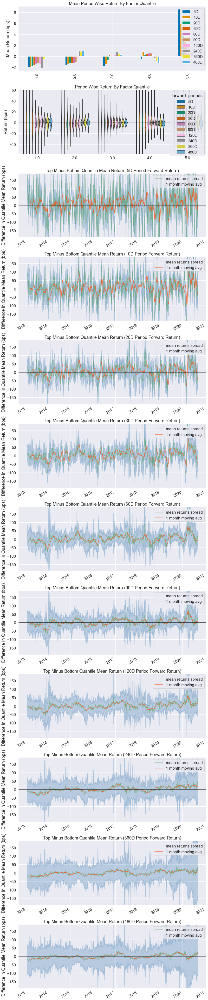

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

Information Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
IC Mean,0.002,0.003,0.003,0.002,0.003,0.003,0.003,0.008,0.007,0.003
IC Std.,0.095,0.091,0.087,0.083,0.076,0.077,0.076,0.073,0.071,0.064
Risk-Adjusted IC,0.022,0.030,0.039,0.023,0.042,0.035,0.043,0.108,0.096,0.053
t-stat(IC),NaN,NaN,1.836,1.097,1.968,1.640,2.007,5.050,4.512,2.505
p-value(IC),NaN,NaN,0.067,0.273,0.049,0.101,0.045,0.000,0.000,0.012
IC Skew,NaN,NaN,0.014,-0.057,-0.098,-0.238,-0.256,-0.387,-0.410,-0.257
IC Kurtosis,NaN,NaN,-0.281,-0.169,-0.085,-0.151,0.020,-0.559,-0.757,-0.925


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

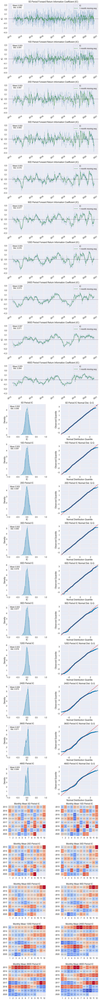

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Quantile 1.0 Mean Turnover,0.064,0.117,0.206,0.276,0.404,0.459,0.484,0.524,0.556,0.578
Quantile 2.0 Mean Turnover,0.217,0.373,0.568,0.663,0.727,0.721,0.721,0.729,0.738,0.749
Quantile 3.0 Mean Turnover,0.461,0.654,0.739,0.723,0.726,0.727,0.733,0.742,0.751,0.756
Quantile 4.0 Mean Turnover,0.579,0.640,0.649,0.652,0.659,0.664,0.670,0.684,0.693,0.698
Quantile 5.0 Mean Turnover,0.493,0.512,0.523,0.530,0.537,0.546,0.552,0.570,0.586,0.598


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Mean Factor Rank Autocorrelation,0.84,0.775,0.709,0.674,0.626,0.599,0.581,0.54,0.513,0.497


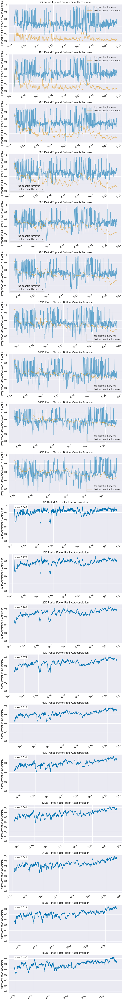

In [153]:
factor_data = get_clean_factor_and_forward_returns(
    tmp.stack(),
    prices,
#     quantiles=4,
    max_loss=0.4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Heat_3

In [35]:
Heat_3 = Heat.apply(lambda x: x+1)
Heat_3 = Heat_3.apply(np.log)

In [36]:
Heat_3 = Heat_3.ffill().mul(0.9 ** exp)
Heat_3

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,0.693147,NaN,NaN,1.945910,NaN,NaN,...,NaN,NaN,NaN,NaN,1.098612,NaN,NaN,NaN,NaN,NaN
2013-01-03,1.098612,NaN,NaN,NaN,0.693147,1.386294,NaN,1.098612,NaN,NaN,...,1.386294,NaN,NaN,NaN,1.791759,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.609438,NaN,NaN,NaN,0.693147,1.247665,NaN,0.988751,NaN,0.693147,...,1.098612,NaN,NaN,NaN,1.612584,NaN,NaN,NaN,NaN,NaN
2013-01-05,1.448494,NaN,NaN,NaN,1.098612,0.693147,NaN,0.889876,NaN,0.623832,...,0.693147,NaN,NaN,NaN,1.451325,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.720800,0.623832,0.075843,0.017351,0.693147,0.623832,0.075843,0.000434,0.000110,0.693147,...,0.720800,0.010245,0.158570,0.000013,0.002894,3.457206e-12,0.001898,0.176189,0.002109,0.331530
2021-12-28,0.648720,0.561449,0.068259,0.015615,0.623832,0.561449,0.068259,0.000391,0.000099,0.623832,...,0.648720,0.009221,0.142713,0.000012,0.002604,3.111486e-12,0.001709,0.158570,0.001898,0.298377
2021-12-29,0.693147,0.505304,0.693147,0.014054,0.561449,0.505304,0.061433,0.000352,0.000089,0.693147,...,0.583848,0.008299,0.128442,0.000011,0.002344,2.800337e-12,0.001538,0.142713,0.001709,0.268539
2021-12-30,0.623832,0.454774,0.623832,0.012649,0.693147,0.454774,0.055290,0.000317,0.000080,0.623832,...,0.525463,0.007469,0.115597,0.000010,0.002109,2.520303e-12,0.001384,0.128442,0.001538,0.241685


/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:159: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(index=x.index)


Dropped 19.7% entries from factor data: 19.4% in forward returns computation and 0.2% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,5.550429e-91,0.693147,0.004776,0.034019,551005,20.321984
2.0,2.977621e-08,0.988751,0.034318,0.070786,550872,20.317079
3.0,3.714839e-03,1.098612,0.208180,0.129912,563027,20.765376
4.0,9.363391e-02,1.448494,0.534972,0.131167,618234,22.801502
5.0,2.513273e-01,5.093750,1.167127,0.559248,428236,15.794059


Returns Analysis


/opt/anaconda3/lib/python3.9/site-packages/alphalens/plotting.py:138: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  returns_table = returns_table.append(alpha_beta)


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Ann. alpha,0.010,0.006,0.005,0.002,0.001,-0.001,-0.002,-0.004,-0.007,-0.007
beta,0.085,0.070,0.064,0.057,0.046,0.050,0.051,0.032,0.042,0.044
Mean Period Wise Return Top Quantile (bps),5.353,4.058,3.373,2.044,1.556,1.118,0.872,-0.111,-0.801,-0.717
Mean Period Wise Return Bottom Quantile (bps),-1.046,-0.799,-0.645,-0.433,-0.412,-0.346,-0.415,-0.993,0.330,0.484
Mean Period Wise Spread (bps),6.399,4.843,3.998,2.448,1.927,1.402,1.213,0.882,-1.155,-1.242


<Figure size 432x288 with 0 Axes>

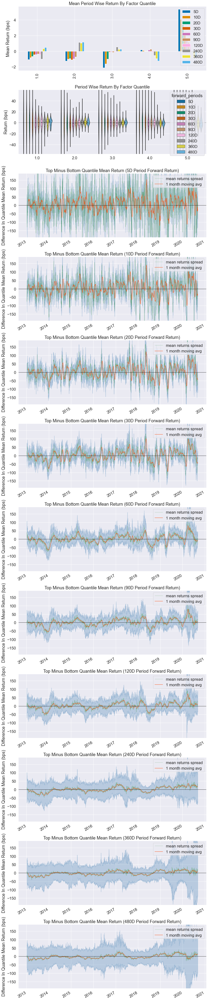

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

Information Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
IC Mean,-0.000,-0.000,-0.001,-0.002,-0.003,-0.004,-0.005,-0.002,-0.004,-0.006
IC Std.,0.095,0.092,0.089,0.084,0.077,0.079,0.079,0.076,0.074,0.068
Risk-Adjusted IC,-0.002,-0.005,-0.009,-0.025,-0.036,-0.053,-0.059,-0.024,-0.050,-0.090
t-stat(IC),NaN,NaN,-0.470,-1.311,-1.896,-2.775,-3.113,-1.267,-2.645,-4.746
p-value(IC),NaN,NaN,0.638,0.190,0.058,0.006,0.002,0.205,0.008,0.000
IC Skew,NaN,NaN,-0.018,-0.058,-0.138,-0.275,-0.307,-0.310,-0.267,-0.116
IC Kurtosis,NaN,NaN,-0.253,-0.235,-0.071,-0.133,0.031,-0.710,-0.962,-1.061


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

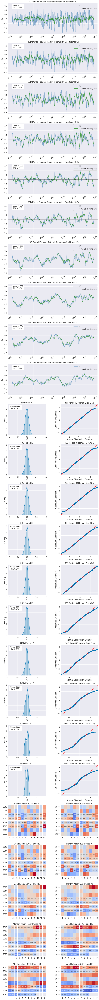

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Quantile 1.0 Mean Turnover,0.058,0.107,0.188,0.255,0.396,0.461,0.485,0.525,0.546,0.579
Quantile 2.0 Mean Turnover,0.196,0.343,0.547,0.655,0.738,0.723,0.722,0.729,0.731,0.748
Quantile 3.0 Mean Turnover,0.428,0.645,0.752,0.723,0.726,0.727,0.734,0.742,0.748,0.759
Quantile 4.0 Mean Turnover,0.558,0.643,0.648,0.650,0.660,0.663,0.671,0.681,0.689,0.700
Quantile 5.0 Mean Turnover,0.432,0.484,0.496,0.502,0.514,0.519,0.529,0.545,0.559,0.572


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Mean Factor Rank Autocorrelation,0.865,0.797,0.729,0.694,0.641,0.616,0.597,0.559,0.537,0.51


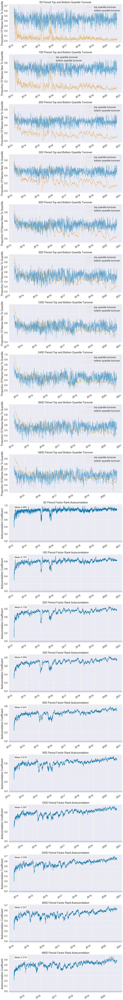

In [181]:
factor_data = get_clean_factor_and_forward_returns(
    Heat_3.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Heat_1

In [37]:
factor_data = get_clean_factor_and_forward_returns(
    Heat_1.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)


KeyboardInterrupt



In [38]:
Heat_1_1 = copy.copy(Heat_1)
Heat_1_1 = Heat_1_1.apply(np.log)
Heat_1_1

,1101,1102,1103,1104,1108,1109,1110,1201,1203,1210,...,9940,9941,9942,9943,9945,9946,9951,9955,9957,9958
2013-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,1.791759,NaN,NaN,...,NaN,NaN,NaN,NaN,0.693147,NaN,NaN,NaN,NaN,NaN
2013-01-03,0.693147,NaN,NaN,NaN,0.000000,1.098612,NaN,0.693147,NaN,NaN,...,1.098612,NaN,NaN,NaN,1.609438,NaN,NaN,NaN,NaN,NaN
2013-01-04,1.386294,NaN,NaN,NaN,0.000000,0.405465,NaN,0.000000,NaN,0.000000,...,0.693147,NaN,NaN,NaN,0.916291,NaN,NaN,NaN,NaN,NaN
2013-01-05,0.693147,NaN,NaN,NaN,0.693147,0.000000,NaN,-0.693147,NaN,-0.693147,...,0.000000,NaN,NaN,NaN,0.223144,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,-2.079442,-0.693147,-14.556091,-24.260151,0.000000,-0.693147,-14.556091,-48.520303,-57.531216,0.000000,...,-2.079442,-27.725887,-9.704061,-71.394160,-36.043653,-171.207354,-38.816242,-9.010913,-38.123095,-4.852030
2021-12-28,-2.772589,-1.386294,-15.249238,-24.953299,-0.693147,-1.386294,-15.249238,-49.213450,-58.224363,-0.693147,...,-2.772589,-28.419034,-10.397208,-72.087307,-36.736801,-171.900501,-39.509389,-9.704061,-38.816242,-5.545177
2021-12-29,0.000000,-2.079442,0.000000,-25.646446,-1.386294,-2.079442,-15.942385,-49.906597,-58.917510,0.000000,...,-3.465736,-29.112182,-11.090355,-72.780454,-37.429948,-172.593648,-40.202536,-10.397208,-39.509389,-6.238325
2021-12-30,-0.693147,-2.772589,-0.693147,-26.339593,0.000000,-2.772589,-16.635532,-50.599744,-59.610658,-0.693147,...,-4.158883,-29.805329,-11.783502,-73.473601,-38.123095,-173.286795,-40.895684,-11.090355,-40.202536,-6.931472


/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:159: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(index=x.index)


Dropped 20.2% entries from factor data: 19.9% in forward returns computation and 0.3% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1.0,-744.440072,-0.693147,-145.216798,125.245537,547881,20.346009
2.0,-99.813194,0.000000,-29.971195,14.653104,549688,20.413114
3.0,-32.865600,0.693147,-9.461938,4.640287,560769,20.824616
4.0,-12.764331,1.098612,-2.108958,1.798215,628755,23.349331
5.0,-6.526007,5.087596,0.418510,1.055772,405725,15.066930


Returns Analysis


/opt/anaconda3/lib/python3.9/site-packages/alphalens/plotting.py:138: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  returns_table = returns_table.append(alpha_beta)


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Ann. alpha,-0.003,-0.003,-0.001,-0.001,-0.004,-0.004,-0.005,-0.003,-0.003,0.002
beta,0.164,0.147,0.131,0.117,0.097,0.092,0.084,0.074,0.026,-0.027
Mean Period Wise Return Top Quantile (bps),7.187,4.507,3.690,2.134,1.480,0.747,0.511,-0.451,-1.085,-0.882
Mean Period Wise Return Bottom Quantile (bps),-0.741,-0.525,-0.514,-0.357,-0.340,-0.208,-0.132,-0.671,0.833,1.059
Mean Period Wise Spread (bps),7.927,5.004,4.158,2.437,1.742,0.854,0.531,0.180,-1.980,-1.992


<Figure size 432x288 with 0 Axes>

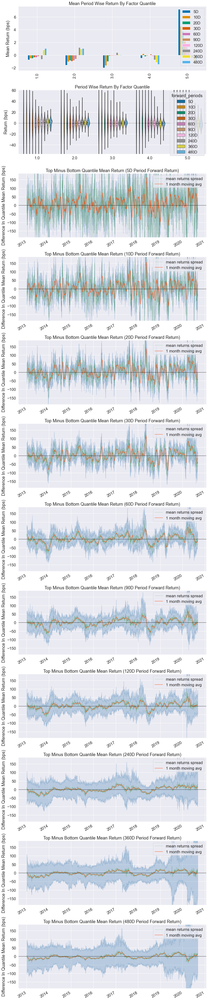

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

Information Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
IC Mean,0.000,-0.001,-0.001,-0.002,-0.003,-0.004,-0.005,-0.003,-0.006,-0.009
IC Std.,0.092,0.089,0.085,0.081,0.074,0.076,0.076,0.074,0.072,0.064
Risk-Adjusted IC,0.001,-0.008,-0.011,-0.028,-0.036,-0.055,-0.062,-0.038,-0.078,-0.136
t-stat(IC),NaN,NaN,-0.570,-1.462,-1.921,-2.903,-3.273,-2.017,-4.121,-7.208
p-value(IC),NaN,NaN,0.569,0.144,0.055,0.004,0.001,0.044,0.000,0.000
IC Skew,NaN,NaN,-0.047,-0.115,-0.224,-0.366,-0.387,-0.343,-0.294,-0.128
IC Kurtosis,NaN,NaN,-0.204,-0.267,-0.043,-0.107,0.011,-0.695,-0.893,-1.005


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInput

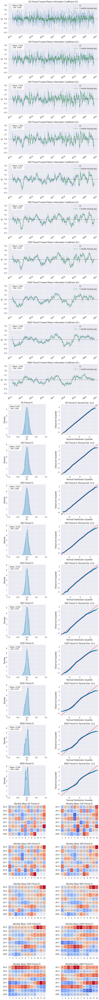

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Quantile 1.0 Mean Turnover,0.059,0.109,0.193,0.262,0.408,0.474,0.497,0.538,0.561,0.597
Quantile 2.0 Mean Turnover,0.199,0.349,0.557,0.663,0.743,0.725,0.721,0.730,0.733,0.748
Quantile 3.0 Mean Turnover,0.437,0.655,0.752,0.721,0.725,0.726,0.734,0.742,0.747,0.759
Quantile 4.0 Mean Turnover,0.552,0.628,0.637,0.639,0.648,0.651,0.659,0.670,0.679,0.688
Quantile 5.0 Mean Turnover,0.438,0.460,0.473,0.480,0.492,0.499,0.509,0.528,0.547,0.564


,5D,10D,20D,30D,60D,90D,120D,240D,360D,480D
Mean Factor Rank Autocorrelation,0.859,0.795,0.727,0.692,0.638,0.613,0.594,0.555,0.532,0.505


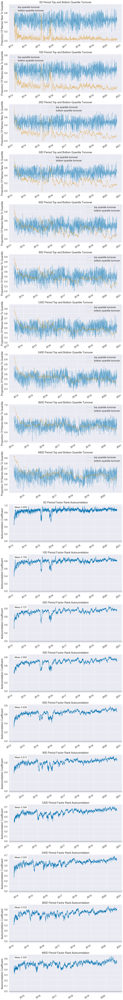

In [156]:
factor_data = get_clean_factor_and_forward_returns(
    Heat_1_1.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)
    
create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

## Heat_2

In [129]:
factor_data = get_clean_factor_and_forward_returns(
    Heat_2.stack(),
    prices,
#     quantiles=4,
    periods=(5, 10 ,20 , 30 ,60 ,90, 120, 240, 360, 480))
#    filter_zscore=None)

create_full_tear_sheet(factor_data) # , long_short=False, group_neutral=False, by_group=False)

/opt/anaconda3/lib/python3.9/site-packages/alphalens/utils.py:159: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  return pd.Series(index=x.index)


Dropped 95.8% entries from factor data: 19.4% in forward returns computation and 76.4% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).


MaxLossExceededError: max_loss (35.0%) exceeded 95.8%, consider increasing it.

# Export Value

In [41]:
observed_time = []

for i in range(2010, 2023):
    for j in [4, 6, 9, 12]:
        observed_time.append(datetime.date(i, j, 1) - datetime.timedelta(days=1))

# observed_time = pd.to_datetime(observed_time).dt.date
observed_time  = pd.Index(observed_time[1:])
observed_time  = observed_time.astype('datetime64[ns]')

In [ ]:
def export(df, name):
    df = df.loc[df.index.isin(observed_time), :]
    df.T.to_excel(writer, sheet_name=name)
    print(df)

FilePath = './計算溢酬/CTBCdata/factorvalues_sentiment.xlsx'
ExcelWorkbook = load_workbook(FilePath)
writer = pd.ExcelWriter(FilePath, engine = 'openpyxl')
writer.book = ExcelWorkbook
export(tmp, 'HEAT')
writer.save()
writer.close()

In [42]:
# def export(df, name):
#     df = df.loc[df.index.isin(observed_time), :]
#     df.T.to_excel(writer, sheet_name=name)
#     print(df)

# writer = pd.ExcelWriter('./計算溢酬/CTBCdata/factorvalues_sentiment.xlsx', engine='xlsxwriter')
# export(tmp, 'HEAT')
# # export(Content_SenScore_3, 'sentiment_2')
# writer.save()

                1101      1102          1103           1104          1108  \
2013-03-31  1.000000  1.000000  3.906250e-03   7.275958e-12  2.500000e-01   
2013-05-31  1.000000  0.015625  1.818989e-12   3.155444e-30  7.812500e-03   
2013-08-31  0.500000  0.250000  4.768372e-07   3.906250e-03  1.000000e+00   
2013-11-30  0.500000  0.500000  1.250000e-01   1.250000e-01  2.500000e-01   
2014-03-31  1.000000  1.000000  6.250000e-02   2.842171e-14  1.000000e+00   
2014-05-31  0.500000  0.250000  2.384186e-07   1.232595e-32  5.000000e-01   
2014-08-31  0.250000  0.250000  9.765625e-04   1.490116e-08  2.500000e-01   
2014-11-30  0.250000  0.125000  3.944305e-31   6.018531e-36  2.500000e-01   
2015-03-31  1.000000  1.000000  2.168404e-19   1.220703e-04  1.000000e+00   
2015-05-31  1.000000  1.000000  1.000000e+00   1.000000e+00  6.250000e-02   
2015-08-31  1.000000  0.000008  8.470329e-22   2.067952e-25  1.000000e+00   
2015-11-30  1.000000  1.000000  5.551115e-17   1.421085e-14  1.250000e-01   

In [33]:
tmp.to_csv('/Users/arthur/Desktop/bbmarket/index_data/heatIndex.csv')

In [39]:
Heat_3.to_csv('/Users/arthur/Desktop/bbmarket/index_data/heatIndex2.csv')